<a href="https://colab.research.google.com/github/EdvanilsonBS/Desafio/blob/main/Desafio_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [42]:
# clone darknet repo
!git clone https://github.com/AlexeyAB/darknet

fatal: destination path 'darknet' already exists and is not an empty directory.


In [43]:
# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

/content/darknet


In [44]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


In [45]:
# make darknet (build)
!make

chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:945:23: warning: variable ‘rgb’ set but not used []8;;https://gcc.gnu.org/onlinedocs/gcc/Warning-Options.html#index-Wunused-but-set-variable-Wunused-but-set-variable]8;;]
  945 |                 float rgb[3];
      |                       ^~~
./src/image_opencv.cpp: In function ‘void cv_draw_object(image, float*, int, int, int*, float*, int*, int, char**)’:
./src/image_opencv.cpp:1443:14: warning: unused variable ‘buff’ []8;;https://gcc.gnu.org/onlinedocs/gcc/Warn

In [46]:
# get yolov3 pretrained coco dataset weights
!wget https://pjreddie.com/media/files/yolov3.weights

--2025-02-11 16:33:57--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights.1’

yolov3.weights.1    100%[===================>] 236.52M  31.5MB/s    in 8.5s    

2025-02-11 16:34:06 (27.9 MB/s) - ‘yolov3.weights.1’ saved [248007048/248007048]



In [47]:
# define helper functions
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload()
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# use this to download a file
def download(path):
  from google.colab import files
  files.download(path)

In [48]:
!./darknet detect <path to config> <path to weights> <path to image>

/bin/bash: -c: line 1: syntax error near unexpected token `<'
/bin/bash: -c: line 1: `./darknet detect <path to config> <path to weights> <path to image>'


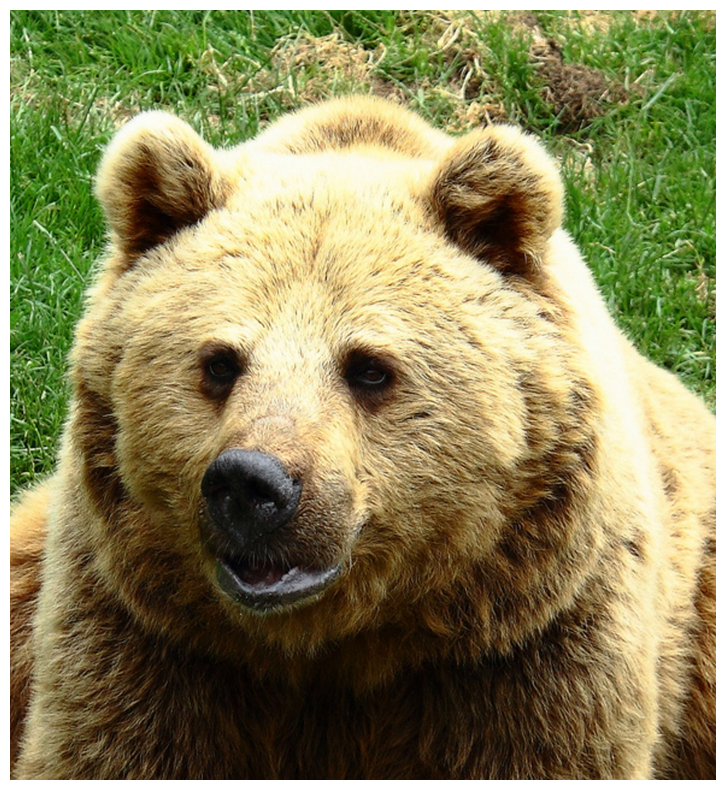

In [49]:
imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000285.jpg')

In [50]:
# run darknet detection
!./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg

 CUDA-version: 12050 (12040)
, cuDNN: 9.2.1, GPU count: 1  
 OpenCV version: 4.5.4
 0 : compute_capability = 750, cudnn_half = 0, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5, 

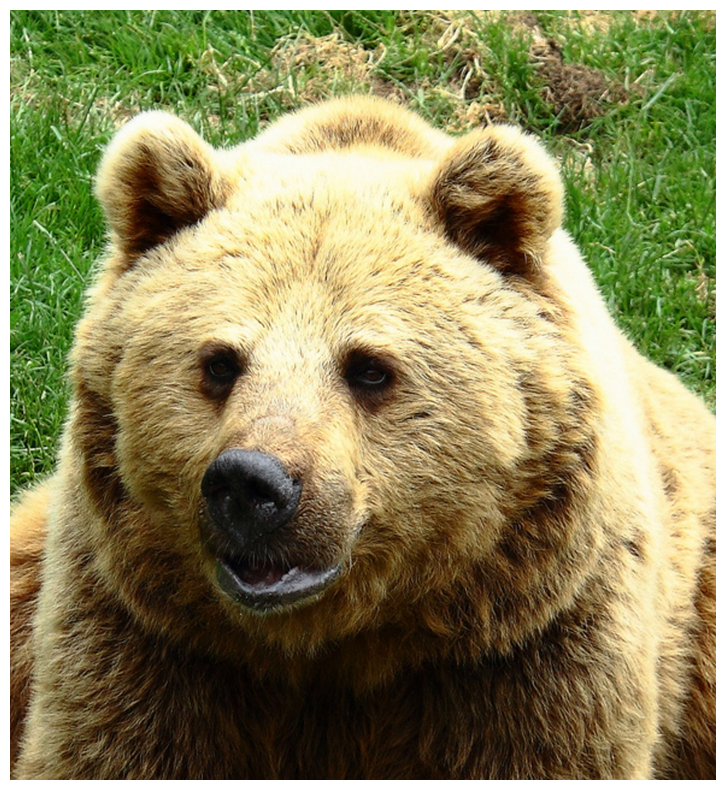

In [51]:
# show image using our helper function
imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000285.jpg')

 CUDA-version: 12050 (12040)
, cuDNN: 9.2.1, GPU count: 1  
 OpenCV version: 4.5.4
 0 : compute_capability = 750, cudnn_half = 0, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5, 

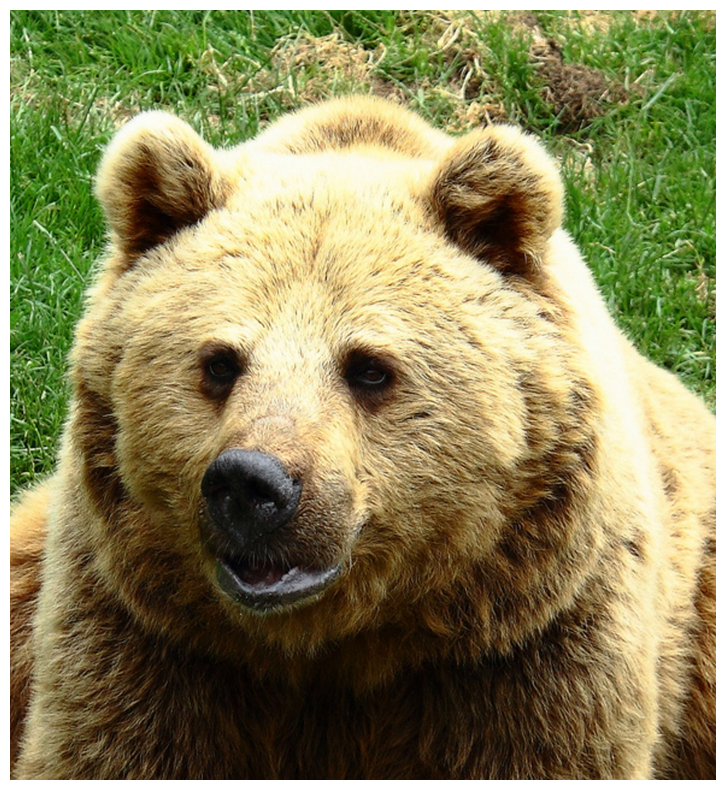

In [52]:
# look we can run another detection!
!./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg
imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000285.jpg')

In [ ]:
raise RuntimeError("Interrompendo a execução do código")



In [ ]:
!./darknet detect cfg/yolov3.cfg yolov3.weights ../<your image name>

In [59]:
# upload an image to root directory (I uploaded an image called street.jpg, you can upload anything)
%cd ..
upload()

/


Saving COCO_val2014_000000000285.jpg to COCO_val2014_000000000285.jpg
saved file COCO_val2014_000000000285.jpg


[Errno 2] No such file or directory: 'darknet'
/
/bin/bash: line 1: ./darknet: No such file or directory


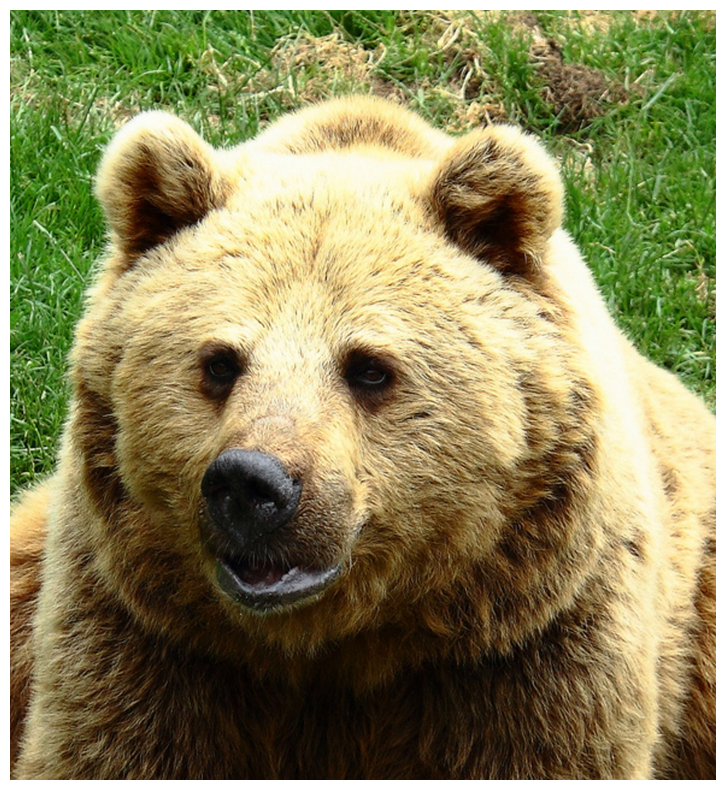

In [60]:
# make sure you are in the darknet folder to run the detections command!
%cd darknet
!./darknet detect cfg/yolov3.cfg yolov3.weights ../street.jpg
imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000285.jpg')

In [64]:
!./darknet detect cfg/yolov3.cfg yolov3.weights /mydrive/<path to image>

/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `./darknet detect cfg/yolov3.cfg yolov3.weights /mydrive/<path to image>'


In [63]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [66]:
# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/MyDrive/Desafio\ Drive/ /mydrive
!ls /mydrive

'[2]-Python-para-ML.gslides'	       Contatos.vcf	     Desafio
'Apresentação sem título.gslides'     'Currículo (1).gdoc'  'Desafio Drive'
'Aula Bônus - Jornada do Excel.xlsm'  'curriculo 2.docx'    'Edivanilson Bezerra.vcf'
 Classroom			      'Curriculo Edy.gdoc'  'Formulário sem título.gform'
'Colab Notebooks'		       Currículo.gdoc	    'My Drive'


[Errno 2] No such file or directory: 'darknet'
/
/bin/bash: line 1: ./darknet: No such file or directory


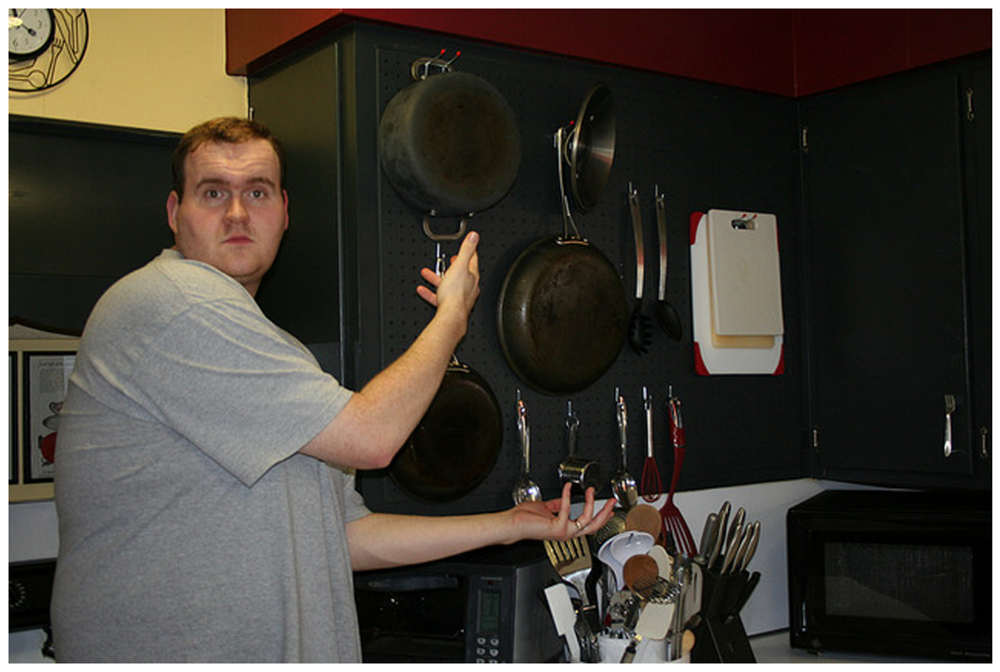

In [71]:
# run darknet command with google drive image (my image path is /images/plane.jpg)
%cd darknet
!./darknet detect cfg/yolov3.cfg yolov3.weights /mydrive/images/plane.jpg
imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000294.jpg')

In [72]:
!cp <file to download> <destination to save file>

/bin/bash: -c: line 1: syntax error near unexpected token `<'
/bin/bash: -c: line 1: `cp <file to download> <destination to save file>'


In [75]:
# LOCAL MACHINE DOWNLOAD
# if you get an error first run then run it again and it should work
download('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000294.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [76]:
# GOOGLE DRIVE DOWNLOAD
# note that I can change what the image name is saved as (I am saving it as detection1.jpg)
!cp predictions.jpg /content/drive/MyDrive/Desafio.jpg

cp: failed to access '/content/drive/MyDrive/Desafio.jpg': Transport endpoint is not connected


In [77]:
!python main.py downloader --classes Elephant Giraffe Hippopotamus Tiger Zebra --type_csv train --limit 300 --multiclasses 1

python3: can't open file '//main.py': [Errno 2] No such file or directory


In [78]:
!python convert_annotations.py

python3: can't open file '//convert_annotations.py': [Errno 2] No such file or directory


In [79]:
rm -r OID/Dataset/train/Elephant_Giraffe_Hippopotamus_Tiger_Zebra/Label/

rm: cannot remove 'OID/Dataset/train/Elephant_Giraffe_Hippopotamus_Tiger_Zebra/Label/': No such file or directory


In [80]:
# this is where my zip is stored (I created a yolov3 folder where I will get my required files from)
!ls /mydrive/yolov3

ls: cannot access '/mydrive/yolov3': No such file or directory


In [81]:
# copy the .zip file into the root directory of cloud VM
!cp /content/drive/MyDrive/Desafio../

cp: missing destination file operand after '/content/drive/MyDrive/Desafio../'
Try 'cp --help' for more information.


In [82]:
# unzip the zip file and its contents should now be in /darknet/data/obj
!unzip ../obj.zip -d data/

unzip:  cannot find or open ../obj.zip, ../obj.zip.zip or ../obj.zip.ZIP.


In [83]:
# download cfg to google drive and change its name
!cp cfg/yolov3.cfg /content/drive/MyDrive/Desafio

cp: failed to access '/content/drive/MyDrive/Desafio': Transport endpoint is not connected


In [85]:
# to download to local machine (change its name to yolov3_custom.cfg once you download)
download('/content/gdrive/MyDrive/Desafio/yolov3.cfg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [86]:
# upload the custom .cfg back to cloud VM from Google Drive
!cp /content/drive/MyDrive/Desafio

# upload the custom .cfg back to cloud VM from local machine (uncomment to use)
#%cd cfg
#upload()
#%cd ..

cp: missing destination file operand after '/content/drive/MyDrive/Desafio'
Try 'cp --help' for more information.


In [87]:
# upload the obj.names and obj.data files to cloud VM from Google Drive
!cp /mydrive/yolov3/obj.names ./data
!cp /mydrive/yolov3/obj.data  ./data

# upload the obj.names and obj.data files to cloud VM from local machine (uncomment to use)
#%cd data
#upload()
#%cd ..

cp: cannot stat '/mydrive/yolov3/obj.names': No such file or directory
cp: cannot stat '/mydrive/yolov3/obj.data': No such file or directory


In [88]:
# upload the generate_train.py script to cloud VM from Google Drive
!cp /mydrive/yolov3/generate_train.py ./

# upload the generate_train.py script to cloud VM from local machine (uncomment to use)
#upload()

cp: cannot stat '/mydrive/yolov3/generate_train.py': No such file or directory


In [89]:
!python generate_train.py

python3: can't open file '//generate_train.py': [Errno 2] No such file or directory


In [90]:
# verify train.txt can be seen in our darknet/data folder
!ls data/

ls: cannot access 'data/': No such file or directory


In [91]:
# upload pretrained convolutional layer weights
!wget http://pjreddie.com/media/files/darknet53.conv.74

--2025-02-11 17:02:13--  http://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://pjreddie.com/media/files/darknet53.conv.74 [following]
--2025-02-11 17:02:13--  https://pjreddie.com/media/files/darknet53.conv.74
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M  8.13MB/s    in 26s     

2025-02-11 17:02:40 (5.92 MB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



In [92]:
!./darknet detector train <path to obj.data> <path to custom config> darknet53.conv.74 -dont_show

/bin/bash: -c: line 1: syntax error near unexpected token `<'
/bin/bash: -c: line 1: `./darknet detector train <path to obj.data> <path to custom config> darknet53.conv.74 -dont_show'


In [96]:
%%javascript
function ClickConnect(){
    console.log("Working");
    document.querySelector("colab-connect-button").click();
}
setInterval(ClickConnect, 60000);


<IPython.core.display.Javascript object>

In [93]:
# train your custom detector
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg darknet53.conv.74 -dont_show

/bin/bash: line 1: ./darknet: No such file or directory


['var', 'etc', 'mnt', 'sbin', 'lib32', 'usr', 'proc', 'libx32', 'bin', 'dev', 'sys', 'home', 'run', 'lib64', 'media', 'opt', 'boot', 'srv', 'lib', 'tmp', 'root', 'content', 'kaggle', 'COCO_val2014_000000000776.jpg', 'darknet53.conv.74', 'mydrive', 'COCO_val2014_000000000285.jpg', '.dockerenv', 'datalab', 'tools', 'python-apt', 'python-apt.tar.xz', 'NGC-DL-CONTAINER-LICENSE', 'cuda-keyring_1.1-1_all.deb']


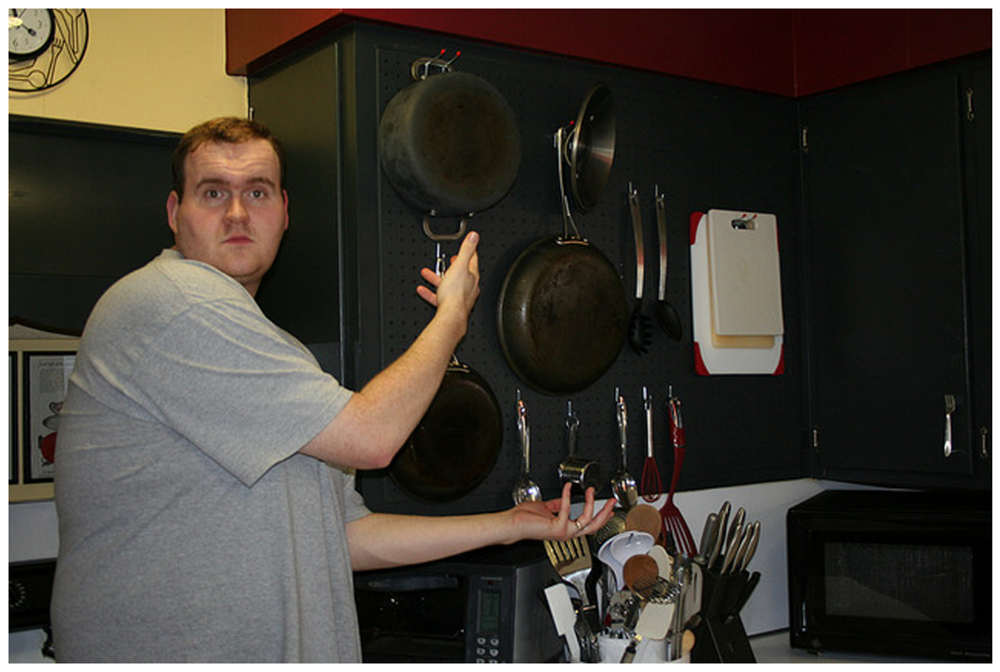

In [102]:
import os
print(os.listdir())  # Lista os arquivos no diretório atual
path = "/content/gdrive/MyDrive/Desafio"

imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000294.jpg')


In [103]:
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights -dont_show

/bin/bash: line 1: ./darknet: No such file or directory


In [104]:
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights -dont_show

/bin/bash: line 1: ./darknet: No such file or directory


In [105]:
# need to set our custom cfg to test mode
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov3_custom.cfg
!sed -i 's/subdivisions=16/subdivisions=1/' yolov3_custom.cfg
%cd ..


[Errno 2] No such file or directory: 'cfg'
/
sed: can't read yolov3_custom.cfg: No such file or directory
sed: can't read yolov3_custom.cfg: No such file or directory
/


/bin/bash: line 1: ./darknet: No such file or directory


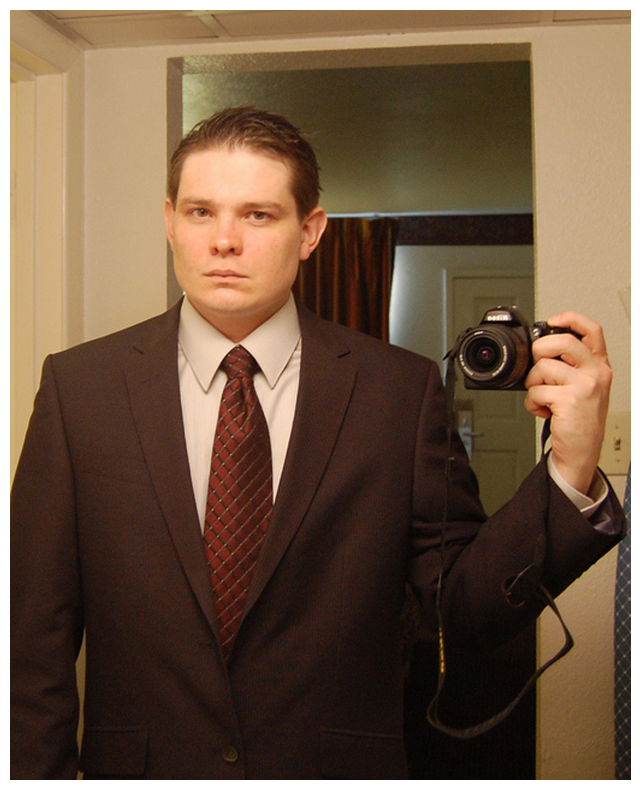

In [108]:
# run your custom detector with this command (upload an image to your google drive to test, thresh flag sets accuracy that detection must be in order to show it)
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/images/safari.jpg -thresh 0.3
imShow('/content/gdrive/MyDrive/Desafio/COCO_val2014_000000000459.jpg')

ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'Car',
    4: 'motorcycle',
    5: 'bus',
    6: 'Truck',
    7: 'cat',
    8: 'dog',
    9: 'house',
    10: 'bird',
}
category_index = {k: {'id' : k, 'name' :ID_MAPPING[k]} for k in ID_MAPPING}